In [2]:
import skimage
from skimage import io as sio
import numpy as np
from matplotlib import pyplot as plt
from pprint import pprint
import time
import math
%matplotlib inline

In [3]:
def grad(img):
    Y = 0.299 * img[:, :, 0] + 0.587 * img[:, :, 1] + 0.114 * img[:, :, 2]
    w, h = img.shape[0], img.shape[1]
    
    Yw = np.zeros((w, h)).astype(np.float64)
    Yw[:, 1:h - 1] = Y[:, 2:] - Y[:, 0:h - 2]
    Yw[:, 0] = Y[:, 1] - Y[:, 0]
    Yw[:, h - 1] = Y[:, h - 1] - Y[:, h - 2]
    
    Yh = np.zeros((w, h)).astype(np.float64)
    Yh[1:w - 1, :] = Y[2:, :] - Y[0:w - 2, :]
    Yh[0, :] = Y[1, :] - Y[0, :]
    Yh[w - 1, :] = Y[w - 1, :] - Y[w - 2, :]
    
    return (Yw * Yw + Yh * Yh) ** 0.5

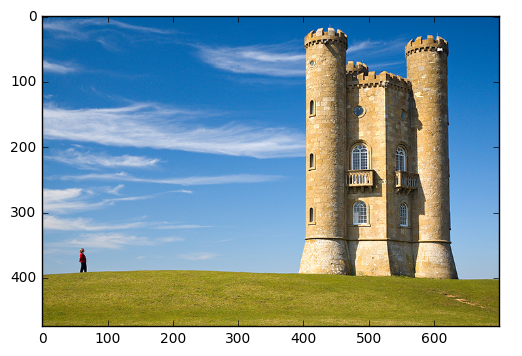

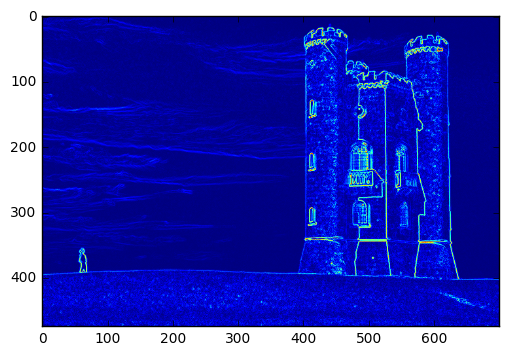

In [74]:
img = sio.imread("./tests/pic_01.png")
plt.imshow(img)
plt.show()

grad_img = grad(img)
plt.imshow(grad_img)
plt.show()


In [10]:
li = [1, 2, 3, 4, 5, 6, 7]
h = len(li)
lii = li[1:h-1]
lii

[2, 3, 4, 5, 6]

In [4]:
def is_inside(x, y, w, h):
    return x >= 0 and y >= 0 and x < w and y < h


#works 100-200 times faster than seam_vertical_dijk
def seam_vertical_dijk_opt(energy):
    w = energy.shape[0]
    h = energy.shape[1]
    dijk = energy.copy()
   
    for x in range(1, w):
        dijk[x, 0] += min(dijk[x - 1, 0], dijk[x - 1, 1])
        dijk[x, h - 1] += min(dijk[x - 1, h - 1], dijk[x - 1, h - 2])
        dijk[x, 1:h - 1] += np.minimum(np.minimum(dijk[x - 1, :h - 2], dijk[x - 1, 1:h - 1]), dijk[x - 1, 2:h])
    return dijk


def seam_vertical_dijk(energy):
    w = energy.shape[0]
    h = energy.shape[1]
    dijk = energy.copy()
    dijk_dirs = {}
    for x in range(1, w):
        for y in range(h):
            dijk[x][y] =  dijk[x - 1][y]
            dijk_dirs[(x, y)] = (x - 1, y) 
            for delta in [1, 0, -1]:
                if is_inside(x - 1, y + delta, w, h):
                    if dijk[x - 1][y + delta] <= dijk[x][y]:
                        dijk[x][y] = dijk[x - 1][y + delta]
                        dijk_dirs[(x, y)] = (x - 1, y + delta)
            dijk[x][y] += energy[x][y]
    return dijk, dijk_dirs


def get_vertical_seam_opt(lens, energy):
    w = lens.shape[0]
    h = lens.shape[1]
    opt_x, opt_y = w - 1, 0
    opt_value = lens[opt_x, opt_y]
    for y in range(h):
        if lens[opt_x, y] < opt_value:
            opt_y = y
            opt_value = lens[opt_x, opt_y]
    path = [(opt_x, opt_y)]
    x, y = opt_x, opt_y
    while x > 0:
        dir_x = x - 1
        dir_y = y
        min_eps = abs(lens[x - 1][y] + energy[x][y] - lens[x][y])
        for delta in [-1, 1]:
            if is_inside(x - 1, y + delta, w, h):
                cur_eps = abs(lens[x - 1][y + delta] + energy[x][y] - lens[x][y])
                if cur_eps < min_eps:
                    min_eps = cur_eps
                    dir_y = y + delta
                    
        x, y = dir_x, dir_y
        path.append((x, y))

    seam_mask = np.zeros(lens.shape)
    for point in path:
        seam_mask[point] = 1
        
    return list(reversed(path)), seam_mask

def get_vertical_seam(lens, dirs):
    w = lens.shape[0]
    h = lens.shape[1]
    opt_x, opt_y = w - 1, 0
    opt_value = lens[opt_x, opt_y]
    for y in range(h):
        if lens[opt_x, y] < opt_value:
            opt_y = y
            opt_value = lens[opt_x, opt_y]
    path = [(opt_x, opt_y)]
    x, y = opt_x, opt_y
    while x > 0:
        x, y = dirs[(x, y)]
        path.append((x, y))

    seam_mask = np.zeros(lens.shape)
    for point in path:
        seam_mask[point] = 1
        
    return list(reversed(path)), seam_mask

    
def seam_transpose(path):
    trans_path = []
    for point in path:
        trans_path.append([point[1], point[0]])
    return trans_path


def img_del_vertical_seam(img, seam):
    w = img.shape[0]
    h = img.shape[1]
    if len(img.shape) == 2:
        new_img = np.zeros((w, h - 1)).astype(np.float64)
    else:
        new_img = np.zeros((w, h - 1, 3)).astype(np.uint8)
    for point in seam:
        x, y = point[0], point[1]
        new_img[x, :] = np.concatenate([img[x, :y], img[x, y + 1:]])
        
    return new_img
 
def get_next_am(img, x, y):
    # return img[x][y]
    w, h = img.shape[0], img.shape[1]
    if is_inside(x, y + 1, w, h):
        # print( (img[x][y] + img[x][y + 1]) // 2)
        return (img[x][y]/2 + img[x][y + 1]/2).astype(np.uint8)
    else:
        return img[x][y]
    
    
def img_add_vertical_seam(img, seam):
    w = img.shape[0]
    h = img.shape[1]
    if len(img.shape) == 2:
        new_img = np.zeros((w, h + 1)).astype(np.float64)
    else:
        new_img = np.zeros((w, h + 1, 3)).astype(np.uint8)
    for point in seam:
        x, y = point[0], point[1]
        if len(img.shape) == 2:
            new_img[x, :] = np.concatenate(
            [img[x, :y + 1],
             np.array([0]),
             img[x, y + 1:]])
            new_img[x, y] += 1.0
            new_img[x, y + 1] += 1.0
        else:
            new_img[x, :] = np.concatenate(
                [img[x, :y + 1], 
                np.array([get_next_am(img, x, y)]), 
                img[x, y + 1:]])

    return new_img



In [5]:
def seam_carve(img, mode, mask=None):
    energy = grad(img)
    if mask is not None:
        energy += 256. * float(img.shape[0]) * float(img.shape[1]) * mask
    # plt.imshow(energy)
    # plt.show()
        
    if mode == 'vertical shrink':
        transponed_energy = np.transpose(energy, axes=[1, 0])
        transponed_img = np.transpose(img, axes=[1, 0, 2])
        transponed_mask = np.transpose(mask, axes=[1, 0])
        
        lens = seam_vertical_dijk_opt(transponed_energy)
        transponed_seam, transponed_seam_mask = get_vertical_seam_opt(lens, energy)
        
        new_transponed_img = img_del_vertical_seam(transponed_img, transponed_seam)
        new_img = np.transpose(new_transponed_img, axes=[1, 0, 2])
        seam = seam_transpose(transponed_seam)
        seam_mask = np.transpose(transponed_seam_mask, axes=[1, 0])
        
        if mask is not None:
            new_transponed_mask = img_del_vertical_seam(transponed_mask, seam)
        else: 
            new_mask = None
        new_mask = np.transpose(transponed_mask, axes=[1, 0])
        return new_img, new_mask, seam_mask
    
    if mode == 'horizontal shrink':
        start = time.time()
       
        lens = seam_vertical_dijk_opt(energy)
        seam, seam_mask = get_vertical_seam_opt(lens, energy)
        
        new_img = img_del_vertical_seam(img, seam)
        # del_time = time.time()
        if mask is not None:
            new_mask = img_del_vertical_seam(mask, seam)
        else:
            new_mask = None
        # print('lens = {}, seam = {}, del = {}', format((lens_opt_time - start, lens_time - lens_opt_time, seam_time - lens_time, del_time - seam_time)))
        # print('accuracy = {}'.format((np.sum((lens_opt - lens)**2))))
        # print(np.sum(seam_mask_opt ** 2))
        # print(np.sum(seam_mask ** 2))
        # print('accuracy = {}'.format((np.sum((seam_mask_opt - seam_mask)**2))))
        # print(lens_opt)
        # print(lens)
        return new_img, new_mask, seam_mask
    
    if mode == 'horizontal expand':
        lens = seam_vertical_dijk_opt(energy)
        seam, seam_mask = get_vertical_seam_opt(lens, energy)
        new_img = img_add_vertical_seam(img, seam)
        if mask is not None:
            new_mask = img_add_vertical_seam(mask, seam)
        else:
            new_mask = None
        return new_img, new_mask, seam_mask
    
    if mode == 'vertical expand':
        
        transponed_energy = np.transpose(energy, axes=[1, 0])
        transponed_img = np.transpose(img, axes=[1, 0, 2])
        transponed_mask = np.transpose(mask, axes=[1, 0])
        
        lens = seam_vertical_dijk_opt(transponed_energy)
        transponed_seam, transponed_seam_mask = get_vertical_seam_opt(lens, energy)
        
        new_transponed_img = img_add_vertical_seam(transponed_img, transponed_seam)
        new_img = np.transpose(new_transponed_img, axes=[1, 0, 2])
        seam = seam_transpose(transponed_seam)
        seam_mask = np.transpose(transponed_seam_mask, axes=[1, 0])
        
        if mask is not None:
            new_transponed_mask = img_add_vertical_seam(transponed_mask, seam)
        else: 
            new_mask = None
        new_mask = np.transpose(transponed_mask, axes=[1, 0])
        return new_img, new_mask, seam_mask 
    
            
def msk_to_std(msk):
    new_msk = ((msk[:,:,0]!=0)*(-1) + (msk[:,:,1]!=0)).astype('int8')    
    new_msk = new_msk.astype(np.float)
    
    # new_msk = (1 - (new_msk - 1) / 127.)
    return new_msk 

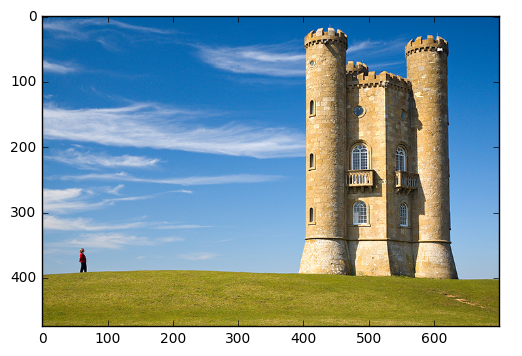

(475, 700, 3)


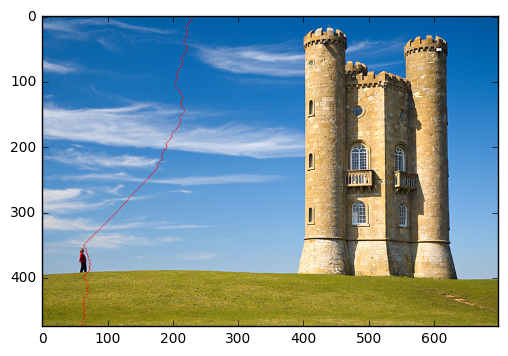

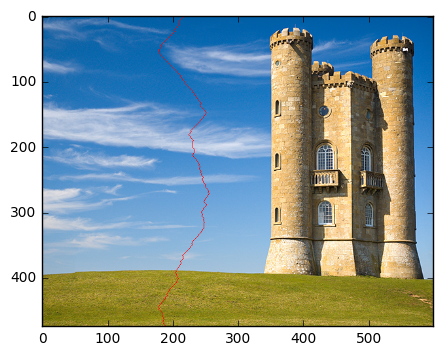

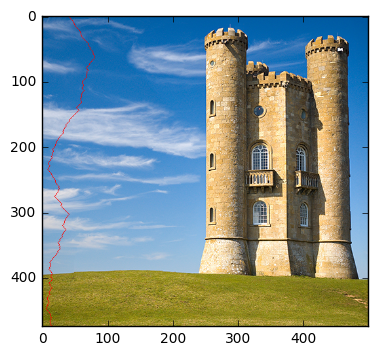

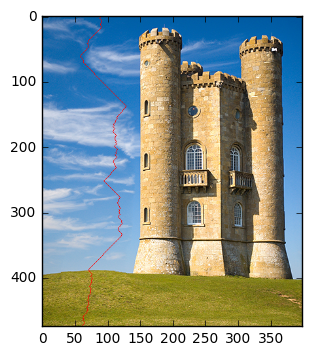

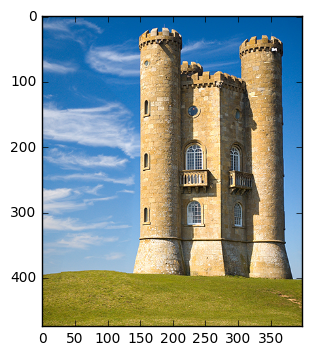

(475, 399, 3)


In [101]:
img = sio.imread("./tests/pic_01.png")
mask =  msk_to_std(sio.imread("./tests/pic_01_mask.png"))
# print(mask[380])
plt.imshow(img)
plt.show()
plt.imshow(mask)
print(img.shape)

for iters in range(301):
    new_img, new_mask, seam_mask = seam_carve(img, 'horizontal shrink', mask=mask)
    if iters % 100 == 0:
        new_img_with_line = new_img.copy()
        # print(new_img_with_line)
        # print(seam_mask)
        new_img_with_line[:, :, 0] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 1] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 2] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 0] += (255 * seam_mask[:, :new_img.shape[1]]).astype(np.uint8)
        plt.imshow(new_img_with_line)
        plt.show()
    img = new_img
    mask = new_mask

plt.imshow(new_img)
plt.show()
print(img.shape)

Как видим, со сжатием алгоритм справляется неплохо.

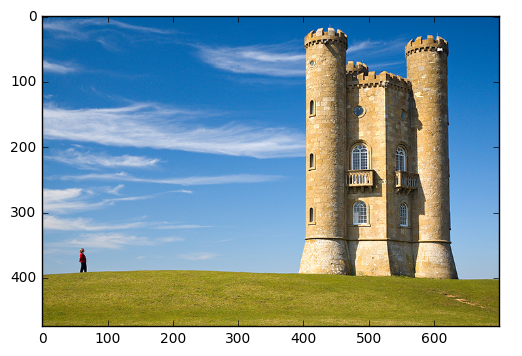

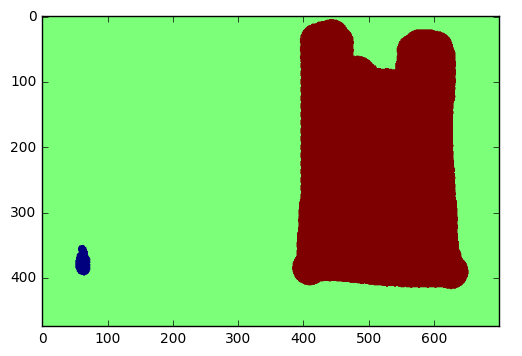

(475, 700, 3)


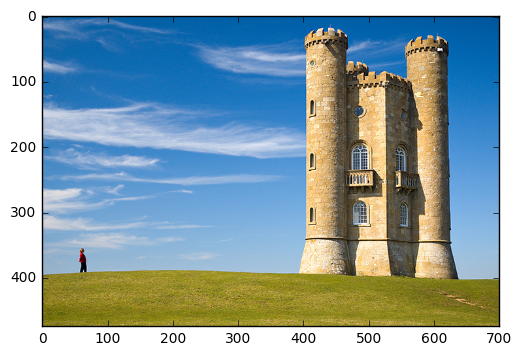

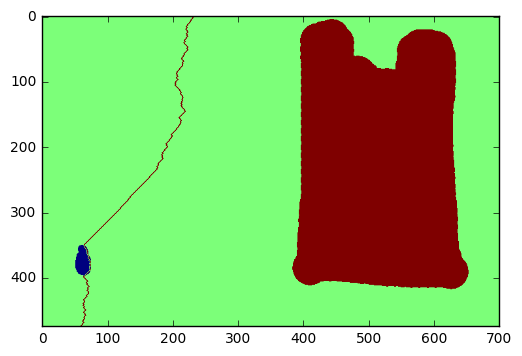

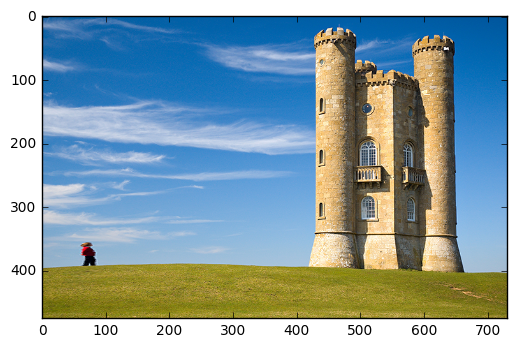

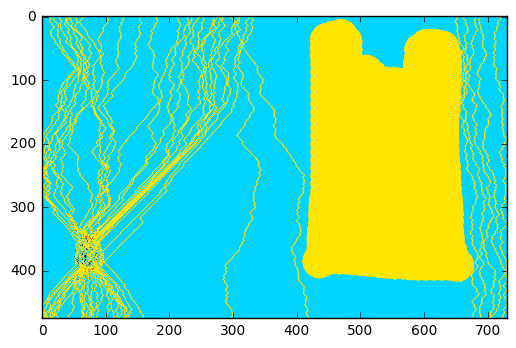

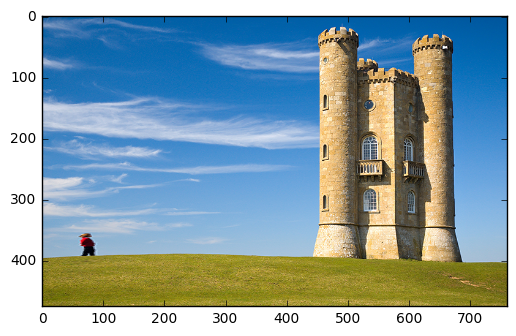

...

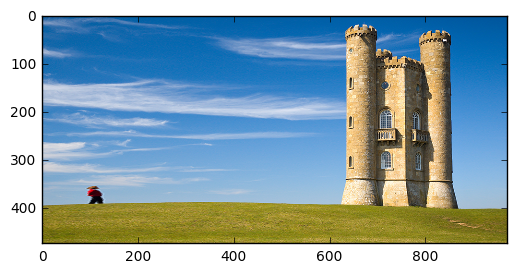

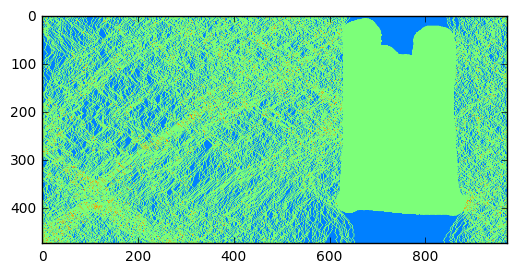

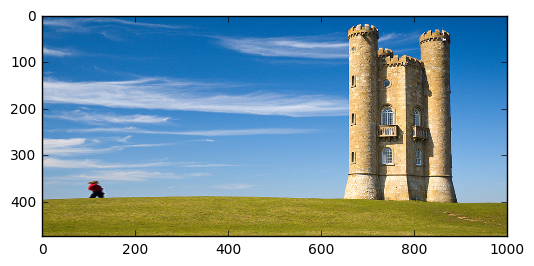

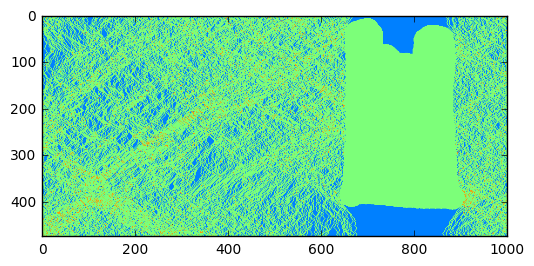

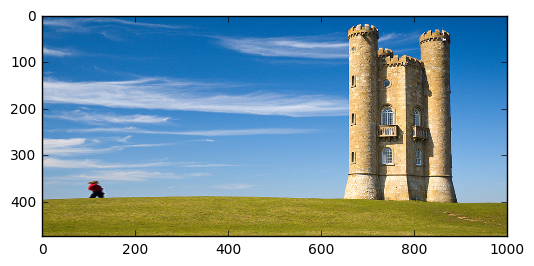

(475, 1001, 3)


In [105]:
img = sio.imread("./tests/pic_01.png")
mask =  msk_to_std(sio.imread("./tests/pic_01_mask.png"))
plt.imshow(img)
plt.show()
plt.imshow(mask)
plt.show()
# print(list(mask))
print(img.shape)

for iters in range(301):
    new_img, new_mask, seam_mask = seam_carve(img, 'horizontal expand', mask=mask)
    if iters % 30 == 0:
        plt.imshow(new_img)
        plt.show()
        plt.imshow(new_mask)
        plt.show()
        # print(list(new_mask))
        # new_img_with_line = new_img.copy()
        # print(new_img_with_line)
        # print(seam_mask)
        # new_img_with_line[:, :, 0] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 1] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 2] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 0] += (255 * seam_mask[:, -1:new_img.shape[1]]).astype(np.uint8)
        # plt.imshow(new_img_with_line)
        # plt.show()
    img = new_img
    mask = new_mask

plt.imshow(new_img)
plt.show()
print(img.shape)

С небольшим видоизмением алгоритма растягивает тоже неплохо (если не обращать внимание на толстого человечка)

In [6]:
!python3 ./code/seam_carve_test.py --full ./tests/

./tests/pic_03.png
./tests/pic_04.png
./tests/pic_07.png
./tests/pic_02.png
./tests/pic_06.png
./tests/pic_05.png
./tests/pic_01.png
Accuracy: 100.00%


In [92]:
 !python3 ./code/seam_carve_test.py --base ./tests/

./tests/pic_03.png
./tests/pic_04.png
./tests/pic_07.png
./tests/pic_02.png
./tests/pic_06.png
./tests/pic_05.png
./tests/pic_01.png
Accuracy: 100.00%


А теперь пробежимся по всем картинкам в директории и оценим, как хорошо они сжимаются и растягиваются. Однако, для этого мы немного адаптируем алгоритм таким образом: когда мы добавляем новый шов, то мы запрещаем разрезать не только по старому,  но и по новому, так как он зачастую очень похож на старый и изображение растягивается в одной точке на каждой итерации, что некрасиво.

In [6]:
def squeeze(img, mask, pixels=50):
    shrink_img = img.copy()
    if mask is not None:
        shrink_mask = mask.copy()
    else:
        shrink_mask = None
    
    for iters in range(pixels):
        new_img, new_mask, seam_mask = seam_carve(shrink_img, 'horizontal shrink', mask=shrink_mask)
        shrink_img = new_img
        shrink_mask = new_mask
        
    return shrink_img, shrink_mask
        
def widering(img, mask, pixels=50):
    expand_img = img.copy()
    if mask is not None:
        expand_mask = mask.copy()
    else:
        expand_mask = None
        
    for iters in range(pixels):
        new_img, new_mask, seam_mask = seam_carve(expand_img, 'horizontal expand', mask=expand_mask)
        expand_img = new_img
        expand_mask = new_mask
        
    return expand_img, expand_mask

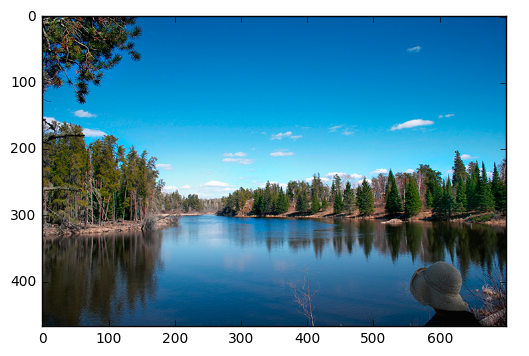

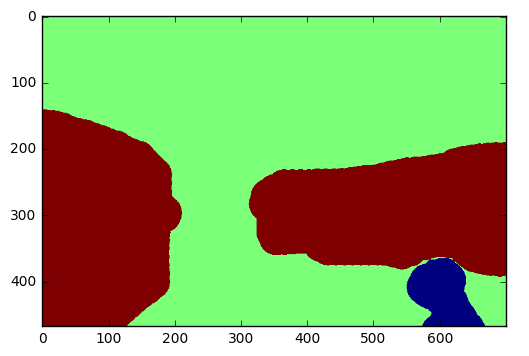

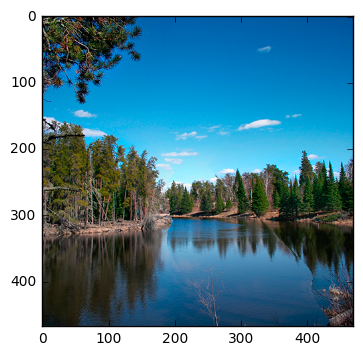

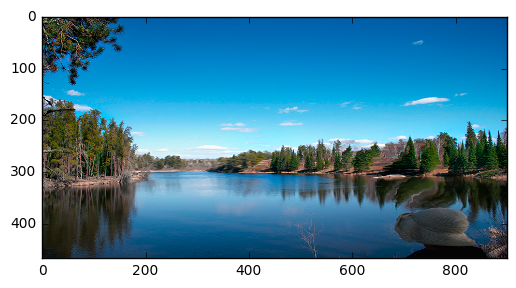

(468, 900)


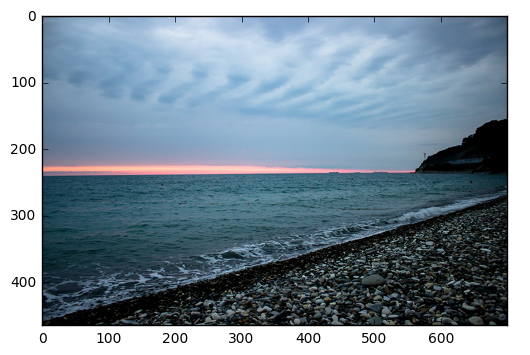

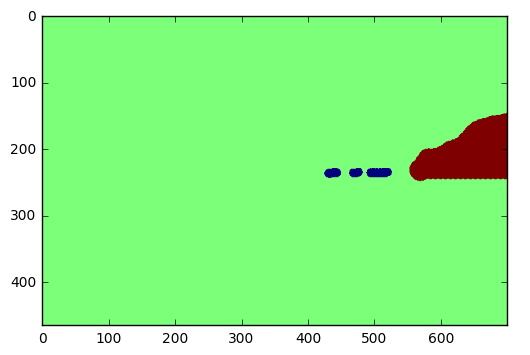

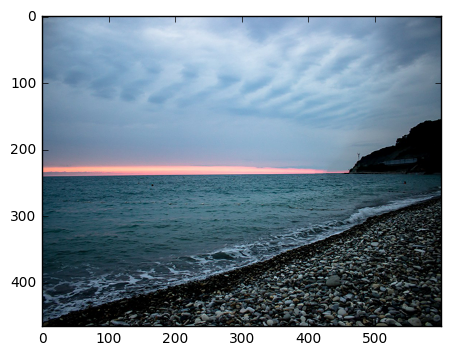

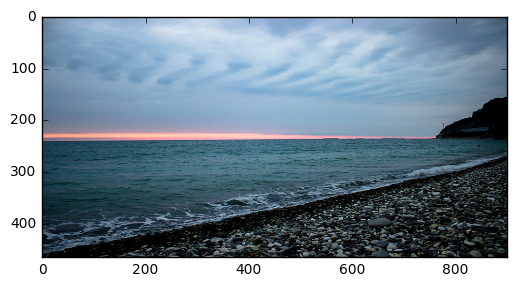

(466, 900)


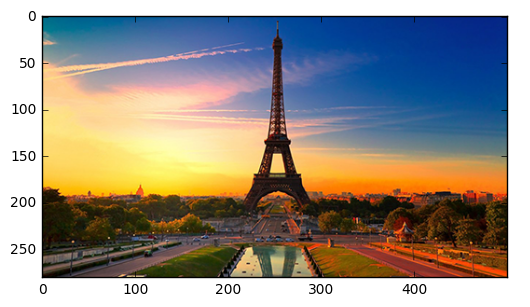

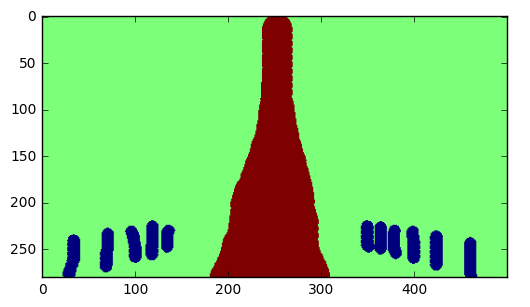

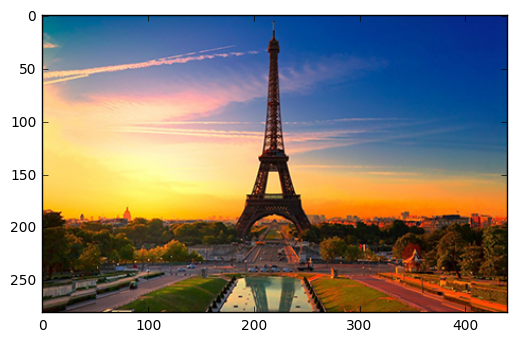

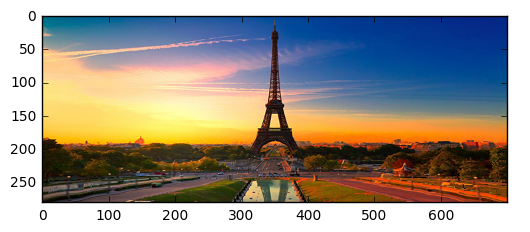

(281, 700)


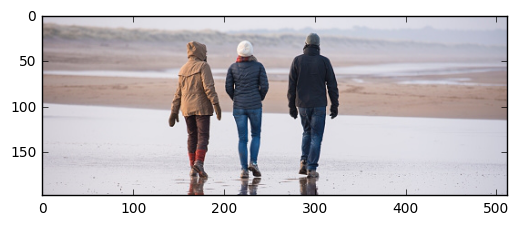

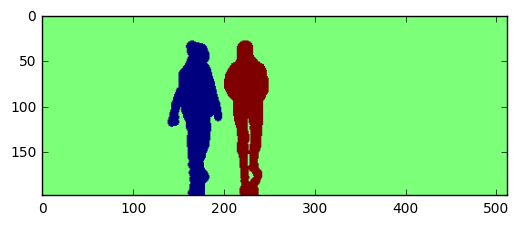

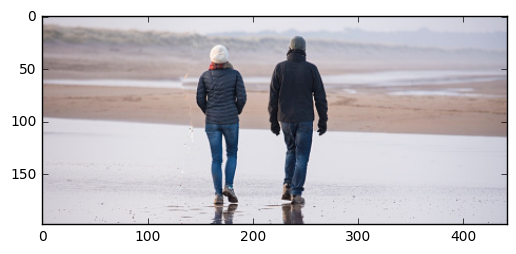

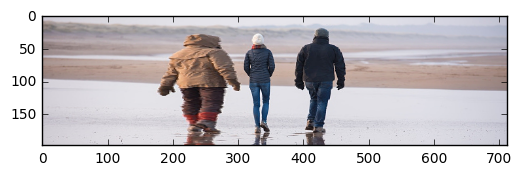

(198, 712)


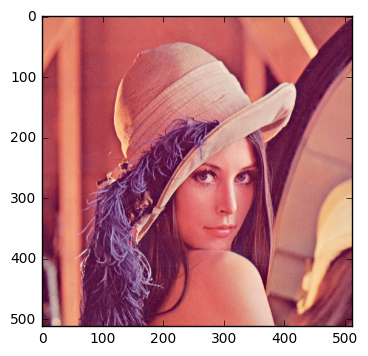

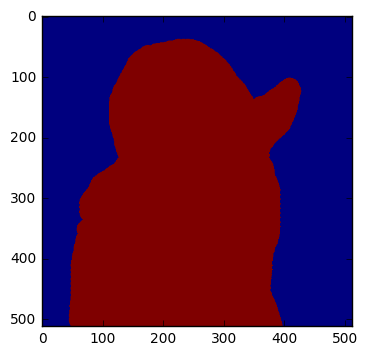

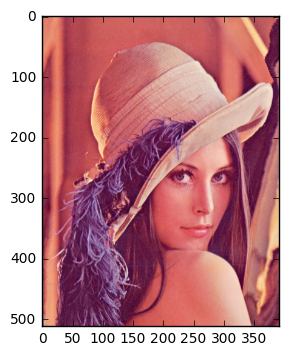

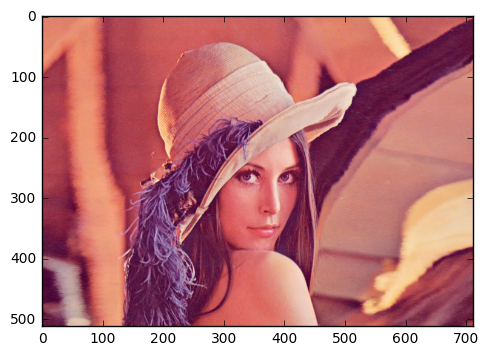

(512, 712)


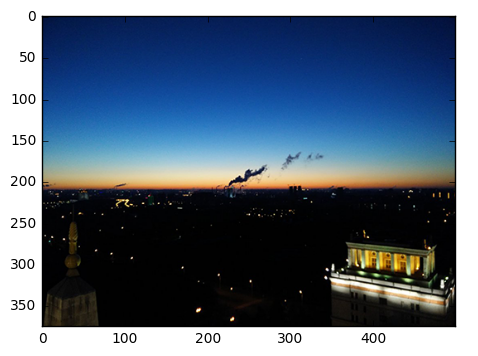

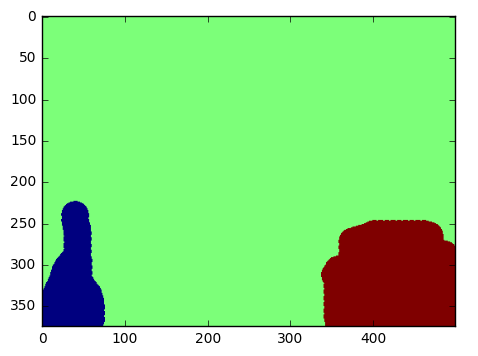

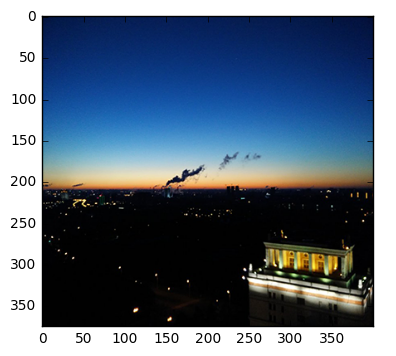

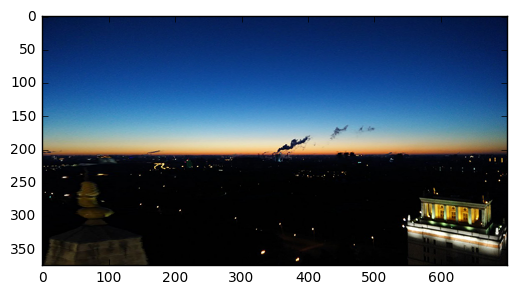

(375, 700)


In [114]:
for num, pixel_sq in zip(['02', '03', '04', '05', '06', '07'], [230, 100, 60, 70, 120, 100]):
    img = sio.imread("./tests/pic_{}.png".format(num))
    mask =  msk_to_std(sio.imread("./tests/pic_{}_mask.png".format(num)))
    
    plt.imshow(img)
    plt.show()
    plt.imshow(mask)
    plt.show()
    
    shrink_img, shrink_mask = squeeze(img, mask, pixels=pixel_sq)
    
    plt.imshow(shrink_img)
    plt.show()
    
    expand_img, expand_mask = widering(img, mask, pixels=200)
   
    plt.imshow(expand_img)
    plt.show()
  

Как видим, сжатие не пошло на пользу Эйфеловой башне и шляпе в лесу, а так везде работает красиво. Расширение же везде не вызывает никаких нареканий.

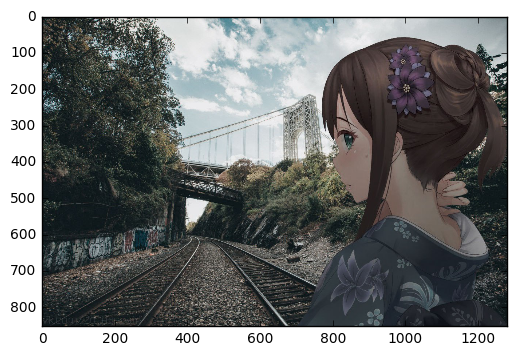

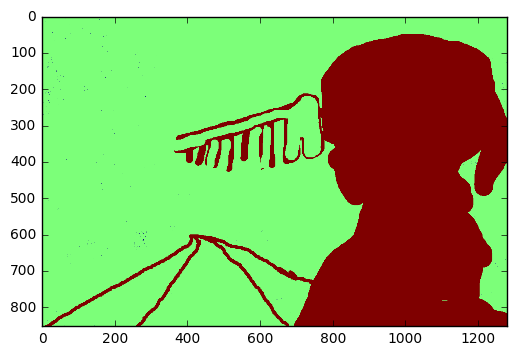

(853, 1280, 3)


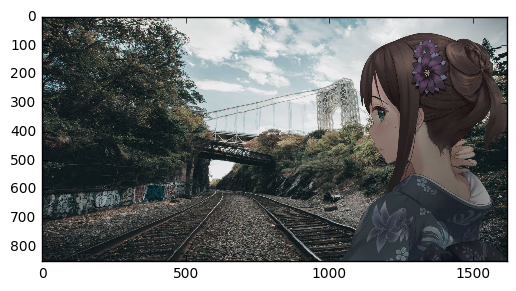

In [149]:
img = sio.imread("./tests/animu4.jpg")
mask = -msk_to_std(sio.imread("./tests/mask444smooth.png"))  
plt.imshow(img)
plt.show()
plt.imshow(mask)
plt.show()

print(img.shape)
    
# shrink_img, shrink_mask = squeeze(img, mask=mask, pixels=200)
    
#plt.imshow(shrink_img)
#plt.show()
#sio.imsave('squeeze_animu4.png', shrink_img)

expand_img, expand_mask = widering(img, mask=mask, pixels=340)
   
plt.imshow(expand_img)
plt.show()
sio.imsave('expanded_animu4.png', expand_img)

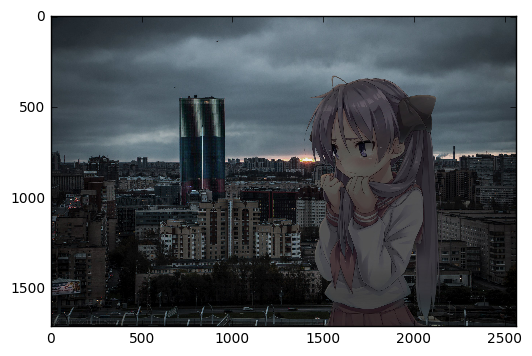

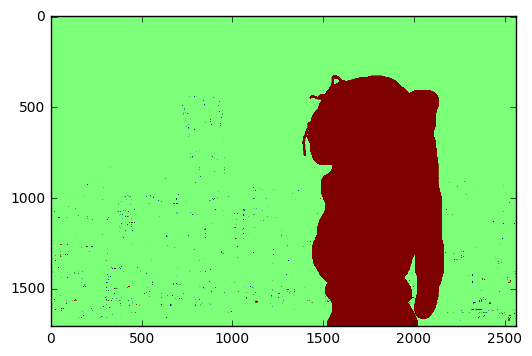

(1707, 2560, 3)


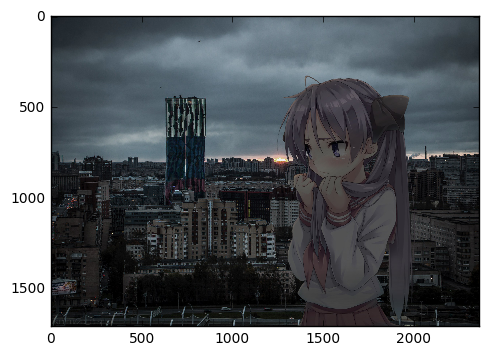

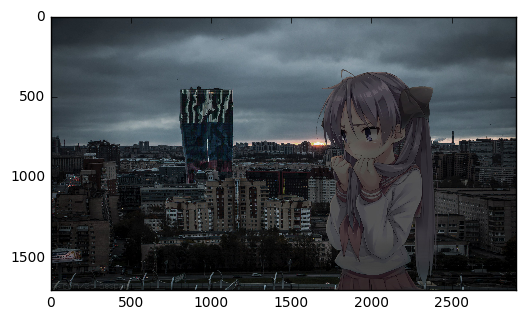

In [7]:
img = sio.imread("./tests/animu2.jpg")
mask = -msk_to_std(sio.imread("./tests/mask2.png"))  
plt.imshow(img)
plt.show()
plt.imshow(mask)
plt.show()

print(img.shape)
    
shrink_img, shrink_mask = squeeze(img, mask=mask, pixels=200)
    
plt.imshow(shrink_img)
plt.show()
sio.imsave('squeeze_animu2.png', shrink_img)

expand_img, expand_mask = widering(img, mask=mask, pixels=340)
   
plt.imshow(expand_img)
plt.show()
sio.imsave('expanded_animu2.png', expand_img)